In [1]:
# import necessary libraries
import pandas as pd
import numpy as np
from tabulate import tabulate

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import plotly.express as px
import plotly.graph_objects as go

import warnings
warnings.filterwarnings('ignore')

import zipfile

In [2]:
# !kaggle datasets download -d samikshakolhe/ecom-product-data

In [3]:
# with zipfile.ZipFile('ecom-product-data.zip', 'r') as zip_ref:
#     zip_ref.extractall()

In [4]:
df = pd.read_csv('ecom_product_data.csv')

print(f"There are {df.shape[0]} rows and {df.shape[1]} columns.")
print(tabulate(df.head(), headers='keys', tablefmt='psql'))

There are 147702 rows and 14 columns.
+----+------------+---------------+-----------+-----------------+---------------+-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+---------------

In [5]:
def check_data(data):
    """check prerequisite dataset characteristics, including data types, null values, duplicates, etc.
    """
    dict={}
    for col in data.columns:
        dtype = data[col].dtypes
        valid_instances = len(data[col])
        unique = data[col].nunique()
        null_count = data[col].isnull().sum()
        null_pct = round((null_count/valid_instances)*100,2)
        duplicates = data[col].duplicated().sum()
        dict[col] = dtype,valid_instances,unique,null_count, null_pct, duplicates
        data_check = pd.DataFrame(dict, index=["dtype","valid_instances","unique","total_null","null_pct","duplicates"]).T
    return data_check

check_data(df)

,dtype,valid_instances,unique,total_null,null_pct,duplicates
item_id,object,147702,145615,0,0.0,2087
marketplace,object,147702,7,0,0.0,147695
country,object,147702,20,0,0.0,147682
main_image_id,object,147702,123511,575,0.39,24190
domain_name,object,147702,32,0,0.0,147670
bullet_point,object,147702,33207,34221,23.17,114494
item_keywords,object,147702,44864,40136,27.17,102837
material,object,147702,1320,100763,68.22,146381
brand,object,147702,407,29114,19.71,147294
color,object,147702,4761,49199,33.31,142940


In [6]:
check_data(df.dropna(axis=0))

,dtype,valid_instances,unique,total_null,null_pct,duplicates
item_id,object,30635,30631,0,0.0,4
marketplace,object,30635,3,0,0.0,30632
country,object,30635,11,0,0.0,30624
main_image_id,object,30635,30226,0,0.0,409
domain_name,object,30635,14,0,0.0,30621
bullet_point,object,30635,3566,0,0.0,27069
item_keywords,object,30635,21542,0,0.0,9093
material,object,30635,276,0,0.0,30359
brand,object,30635,73,0,0.0,30562
color,object,30635,625,0,0.0,30010


In [7]:
df.dropna(axis=0).groupby("item_name")["color"].nunique().reset_index().sort_values("color",ascending=False).item_name.head(1).values

array(['Girls\' Petite Sterling Silver Birthstone Open Heart Stud Earrings and 16" Pendant Necklace Jewelry Set'],
      dtype=object)

In [8]:
df.dropna(axis=0)[df.item_name == 'Girls\' Petite Sterling Silver Birthstone Open Heart Stud Earrings and 16" Pendant Necklace Jewelry Set']

,item_id,marketplace,country,main_image_id,domain_name,bullet_point,item_keywords,material,brand,color,item_name,model_name,model_number,product_type
22748,B01HGKTM5A,Amazon,AE,71IORaOBEcL,amazon.ae,Birthstone jewelry set featuring 2.5mm genuine...,delicate small tiny haert solitaire citrines h...,Metal,Amazon Collection,Yellow,Girls' Petite Sterling Silver Birthstone Open ...,Lulabelle Children'S Rhodium Plated Sterling S...,R9AA2C150Q,FINEOTHER
37084,B01HGKTIKY,Amazon,AE,710M1CD6xDL,amazon.ae,Birthstone jewelry set featuring 2.5mm created...,delicate small tiny haert solitaire saphire wh...,Metal,Amazon Collection,White,Girls' Petite Sterling Silver Birthstone Open ...,Lulabelle Children'S Rhodium Plated Sterling S...,R9AA2CDC0Q,FINEOTHER
37851,B01HGKTHQ4,Amazon,AE,71geu8ugMSL,amazon.ae,Birthstone jewelry set featuring 2.5mm created...,delicate small tiny haert solitaire aqua marin...,Metal,Amazon Collection,Blue,Girls' Petite Sterling Silver Birthstone Open ...,R9AA2C360Q,R9AA2C360Q,FINEOTHER
58166,B01HGKTHGO,Amazon,AE,71GWjs5YRwL,amazon.ae,Birthstone jewelry set featuring 2.5mm created...,delicate small tiny haert solitaire rubies hol...,Metal,Amazon Collection,Red,Girls' Petite Sterling Silver Birthstone Open ...,Lulabelle Children'S Rhodium Plated Sterling S...,R9AA2C010Q,FINEOTHER
70946,B01HGKTHB4,Amazon,AE,71SB3QYBF0L,amazon.ae,Birthstone jewelry set featuring 2.5mm created...,delicate small tiny haert solitaire emarald em...,Metal,Amazon Collection,Green,Girls' Petite Sterling Silver Birthstone Open ...,R9AA2C610Q,R9AA2C610Q,FINEOTHER
130598,B01HGKTNFY,Amazon,AE,71KRwfiGr-L,amazon.ae,Birthstone jewelry set featuring 2.5mm created...,delicate small tiny haert solitaire holiday gi...,Metal,Amazon Collection,White,Girls' Petite Sterling Silver Birthstone Open ...,R9AA2C390Q,R9AA2C390Q,FINEOTHER


In [9]:
df.dropna(axis=0)[df.item_name == "Movian Moselle."]

,item_id,marketplace,country,main_image_id,domain_name,bullet_point,item_keywords,material,brand,color,item_name,model_name,model_number,product_type


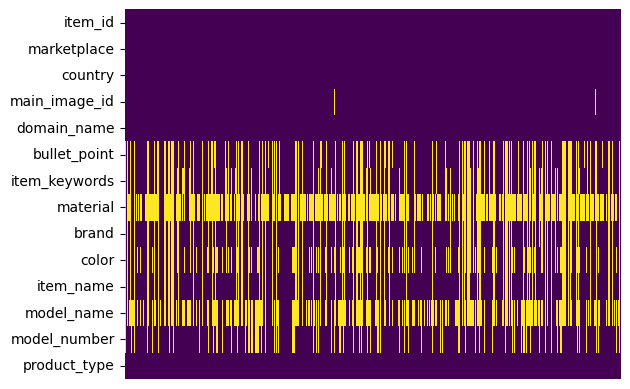

In [10]:
# check missing values
sns.heatmap(df.isnull().T,xticklabels=False,cbar=False,cmap='viridis')
plt.show()

In [11]:
def check_unique(data,top_n=5):
    """check unique values in each column
    """
    nunique = data.apply(lambda col: col.nunique())
    null_pct = data.apply(lambda col: col.isnull().sum()/len(col)*100)
    sample_values = data.apply(lambda col: '; '.join(map(str, list(col.unique())[:top_n])))
    data_check = pd.DataFrame({
        'Unique Count': nunique,
        'Has null': null_pct,
        f'Top {top_n} Sample Values': sample_values
    })
    return data_check

#display all unique values
print(tabulate(check_unique(df), headers='keys', tablefmt='psql'))

+---------------+----------------+------------+-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [93]:
df.duplicated().sum()

0

In [94]:
print("\n".join(str(i) for i in df["model_name"].unique()))

Lenovo K4 Note
Sony Xperia Z1 L39H
nan
Nokia 8.1
Sony Xperia L1
HTC U Ultra
InFocus M2
Lenovo Z6 Pro
Huawei Nova 3i
Samsung Galaxy M31
Huawei Y9 (2019)
Vivo U20
LED 35W GU5.3 WW 36D ND 2PK
Poco X2
Sony Xperia Z2
Tecno i3 Pro
Giana Open Toe Bootie With Pearl Buckle
Samsung Galaxy M20
Lava A97
iVooMi i1
Oppo A71
Gionee F10
Samsung Galaxy C7 Pro
Asus Zenfone Max Pro M1 ZB601KL
Oppo F7
Men'S Stainless Steel Band Ring With Brown Leather Inlay 8Mm
Lyf Flame 8
Motorola Moto E 2nd Generation
Samsung Galaxy A3 (2016)
10.or G
Vivo V7 Plus
LG W10
Motorola Moto Z Play
Albert
Realme C3
Lenovo Vibe X3
123662
Samsung Galaxy S8 Plus
Samsung Galaxy A30s
Lenovo K8 Note
Honn
Prase-s-2b-6 Court
Platinum-Plated Sterling Silver Swarovski Zirconia Red White Heart All-Around Ring, size 7
Huawei Honor 4C
Slip on
Triple Strap Chukka
Samsung Galaxy M21
Vivo V3 Max
Classic Silk 3" Necktie
Moda-32
Samsung Galaxy J6 Plus
Sony Xperia Z5 Dual
Ashby Suede
Reef-57
Oppo F3
Lyle1w4001a
Almoq-1w106
Samsung Galaxy S6 edge 

In [95]:
print("\n".join(str(i) for i in df["item_name"].unique()))

Amazon Brand - Solimo Designer Couples Sitting at Dark 3D Printed Hard Back Case Mobile Cover for Lenovo K4 Note
Amazon Brand - Solimo Designer Leaf on Wood 3D Printed Hard Back Case Mobile Cover for Sony Xperia Z1 L39H
Stone & Beam Contemporary Doily Wool Farmhouse Rug
Amazon Brand - Solimo Plastic Multipurpose Modular Drawer, 3 Racks, Multicolor
Amazon Brand - Solimo Designer Take It Easy UV Printed Soft Back Case Mobile Cover for Nokia 8.1
Amazon Brand - Solimo Body Wash, Cool Mist Scent, 21 fl oz (Pack of 1)
Thirty Five Kent Men's Cashmere Zig Zag Scarf, Blue
nan
Amazon Brand - Solimo Designer Rangolis 3D Printed Hard Back Case Mobile Cover for Sony Xperia L1
Amazon Brand - Solimo Designer No Hate On Wooden Block 3D Printed Hard Back Case Mobile Cover for HTC U Ultra
Amazon Brand - Solimo Designer Red Paint On Wall 3D Printed Hard Back Case Mobile Cover for InFocus M2
Amazon Brand - Solimo Designer Panda Texture UV Printed Soft Back Case Mobile Cover for Lenovo Z6 Pro
Teen Mix By C

In [96]:
# Select main features for CBF

features_chosen = ["marketplace","country","bullet_point","item_keywords","material","brand","color","model_name", "product_type"]

final_df = df[features_chosen]

final_df.head()

,marketplace,country,bullet_point,item_keywords,material,brand,color,model_name,product_type
0,Amazon,IN,3D Printed Hard Back Case Mobile Cover for Len...,mobile cover back cover mobile case phone case...,NaN,Amazon Brand - Solimo,Others,Lenovo K4 Note,CELLULAR_PHONE_CASE
1,Amazon,IN,3D Printed Hard Back Case Mobile Cover for Son...,mobile cover back cover mobile case phone case...,Wood,Amazon Brand - Solimo,others,Sony Xperia Z1 L39H,CELLULAR_PHONE_CASE
2,Amazon,AE,NaN,small de fur rooms navidad woven girls shag pa...,NaN,Stone & Beam,NaN,NaN,HOME_FURNITURE_AND_DECOR
3,Amazon,IN,Solimo Plastic Multipurpose Modular Drawer; sm...,drawer modular drawer 3 rack modular drawer ki...,Plastic,Amazon Brand - Solimo,Multicolor,NaN,HOME
4,Amazon,IN,"Snug fit for Nokia 8.1, with perfect cut-outs ...",Back Cover Designer Case Designer Take It Easy...,Silicon,Amazon Brand - Solimo,Multicolor,Nokia 8.1,CELLULAR_PHONE_CASE


In [98]:
from deep_translator import GoogleTranslator
from langdetect import detect

translator = GoogleTranslator(source='auto', target='en')
cols_analyze = ["bullet_point","item_keywords"]

def translate_if_not_en(text):
    try:
        text = str(text) 
        detected_lang = detect(text)  
        if detected_lang in ["ja", "zh-cn", "zh-tw", "ko"] and text != "nan":
            translated_text = translator.translate(text)  
            print(f"Original: {text} | Translated: {translated_text}")
            return translated_text
        return text 
    except Exception as e:
        print(f"Error processing text: {text} | Error: {e}")
        return text

# Apply translation to the DataFrame
for col in cols_analyze:
    print(f"Processing column: {col}")
    final_df[col] = final_df[col].apply(translate_if_not_en)

# Print the final DataFrame
print("\nTranslated DataFrame:")
print(final_df)

Processing column: bullet_point
Error processing text: 0 | Error: No features in text.
Error processing text: 0 | Error: No features in text.
Error processing text: / | Error: No features in text.
Original: オイルゴム製ブロンズ仕上げ プルの長さ：4.38インチ 穴から穴のセンター：3.75-インチ プロジェクト：1.06インチ 1インチ＆1.63インチ取り付けネジが含まれています | Translated: Oil-rubberized bronze finish Pull length: 4.38" Hole to hole center: 3.75-" Project: 1.06" Includes 1" & 1.63" mounting screws
Original: アンティーク真鍮仕上げ ネジが含まれています 耐久性のある亜鉛合金製 | Translated: Antique brass finish Screws included Made from durable zinc alloy
Original: サテンニッケル仕上げ プルの長さ：5.13インチ 穴から穴中心：3インチ プロジェクト：0.86-インチ 1インチ＆1.63インチ取り付けネジが含まれています | Translated: Satin Nickel Finish Pull Length: 5.13" Hole to Hole Center: 3" Project: 0.86-" Includes 1" & 1.63" mounting screws
Original: アンティーク真鍮仕上げ ネジが含まれています 耐久性のある亜鉛合金製 | Translated: Antique brass finish Screws included Made from durable zinc alloy
Original: オイルゴム製ブロンズ仕上げ プロジェクト：0.97-インチ 直径：1.25インチ 1インチ＆1.63インチ取り付けネジが含まれています 10パック | Translat

In [100]:
import os

if not os.path.exists("./dataset"):
    os.makedirs("./dataset")

with open("./dataset/translated_prod_details.csv", "w") as file:
    file.write(final_df.to_csv(index=False))

In [222]:
final_df = pd.read_csv("./dataset/translated_prod_details.csv")

In [223]:
check_data(final_df)

,dtype,valid_instances,unique,total_null,null_pct,duplicates
marketplace,object,147702,7,0,0.0,147695
country,object,147702,20,0,0.0,147682
bullet_point,object,147702,33207,34221,23.17,114494
item_keywords,object,147702,44864,40136,27.17,102837
material,object,147702,1320,100763,68.22,146381
brand,object,147702,407,29114,19.71,147294
color,object,147702,4761,49199,33.31,142940
model_name,object,147702,5627,73031,49.44,142074
product_type,object,147702,576,0,0.0,147126


In [224]:
import re
final_df = final_df[~final_df["bullet_point"].apply(lambda row: pd.isnull(row) or bool(re.search('0|Yes|No|yes|no|/', row)))]

check_data(final_df)

,dtype,valid_instances,unique,total_null,null_pct,duplicates
marketplace,object,25359,6,0,0.0,25353
country,object,25359,12,0,0.0,25347
bullet_point,object,25359,8192,0,0.0,17167
item_keywords,object,25359,14977,3523,13.89,10381
material,object,25359,392,11828,46.64,24966
brand,object,25359,181,1147,4.52,25177
color,object,25359,1379,6661,26.27,23979
model_name,object,25359,2244,10665,42.06,23114
product_type,object,25359,345,0,0.0,25014


In [225]:
# since the dataset is quite huge, I will prioritize instances where full informations are present

# final_df = final_df[final_df.isnull().any(axis=1)==False]

In [226]:
final_df = final_df.merge(df[["item_name","item_id"]], right_index=True,left_index=True)

check_data(final_df)

,dtype,valid_instances,unique,total_null,null_pct,duplicates
marketplace,object,25359,6,0,0.0,25353
country,object,25359,12,0,0.0,25347
bullet_point,object,25359,8192,0,0.0,17167
item_keywords,object,25359,14977,3523,13.89,10381
material,object,25359,392,11828,46.64,24966
brand,object,25359,181,1147,4.52,25177
color,object,25359,1379,6661,26.27,23979
model_name,object,25359,2244,10665,42.06,23114
product_type,object,25359,345,0,0.0,25014
item_name,object,25359,24183,0,0.0,1176


In [227]:
final_df = final_df.drop(["model_name"],axis=1)

final_df.replace(np.nan,"Unknown",inplace=True)

In [228]:
from rapidfuzz import fuzz
from collections import Counter

def group_similar_names_rapid(names, threshold=80):
    groups = []
    for name in names:
        matched = False
        for group in groups:
            if fuzz.ratio(name, group[0]) >= threshold:
                group.append(name)
                matched = True
                break
        if not matched:
            groups.append([name])
    return groups

# Step 1: Group similar names
groups = group_similar_names_rapid(final_df["item_name"], threshold=75)

# Step 2: Extract base name as the common words across the group
def extract_common_words(group):
    # Tokenize
    word_sets = [set(name.lower().split()) for name in group]
    # Find intersection of all word sets
    common_words = set.intersection(*word_sets)
    # Base name
    base_name = " ".join(word for word in group[0].split() if word.lower() in common_words)
    return base_name


base_name_map = {}
for group in groups:
    base_name = extract_common_words(group)
    for name in group:
        base_name_map[name] = base_name

final_df["new_name"] = final_df["item_name"].map(base_name_map)

grouped_final_df = final_df.groupby("new_name").agg({
    "color": lambda x: x.unique().tolist(),
    "marketplace":lambda x: x.unique().tolist(),
    "country":lambda x: x.unique().tolist(),
    "bullet_point":lambda x: x.value_counts().idxmax(),
    "item_keywords": lambda x: max(x, key=len),
    "material":lambda x: " ".join(x.unique()),
    "brand":lambda x: x.unique().tolist(),
    "product_type":lambda x: x.unique().tolist()
}).reset_index()

grouped_final_df = grouped_final_df.loc[grouped_final_df["new_name"].str.strip()!=""].reset_index(drop=True)

pd.reset_option("display.max_colwidth")
grouped_final_df

,new_name,color,marketplace,country,bullet_point,item_keywords,material,brand,product_type
0,"(1/10Cttw, I-J Color, I2-I3 Clarity) , whites",[Unknown],[Amazon],[JP],"All our diamond suppliers, to ensure they comp...",Unknown,Unknown,[Unknown],"[RING, FINERING]"
1,(Renewed) Amazon Brand - Solimo Lunch Box with...,[Green],[Amazon],[IN],This Amazon Renewed product will be in an unbo...,lunch box lunch solimo solimo lunch box lunch ...,Plastic,[Amazon Brand - Solimo],[KITCHEN]
2,(Renewed) Amazon Brand - Solimo Wall (Matte Fi...,"[Walnut, Wenge]",[Amazon],[IN],This Amazon Renewed product will be in an unbo...,book cases and shelves book racks for home boo...,MDF,[Amazon Brand - Solimo],[FURNITURE]
3,(Renewed) AmazonBasics 4-Piece Exercise and Re...,[Unknown],[Amazon],[IN],This Amazon Renewed product will be in an unbo...,exercise bands exercise band exercise bands fo...,Rubber,[AmazonBasics],[SPORTING_GOODS]
4,(Renewed) AmazonBasics 78 cm Light Blue Hardsi...,[Light Blue],[Amazon],[IN],This Amazon Renewed product will be in an unbo...,Unknown,Others,[AmazonBasics],[SUITCASE]
...,...,...,...,...,...,...,...,...,...
4535,mm Click Top Hoop Earrings,[Silver],[Amazon],[GB],Sterling Silver Hoop Earrings Imported Crafted...,"women,womens,fashion,plated,fine,not,applicabl...",Not applicable,[Amazon Collection],[EARRING]
4536,platinum plated sterling silver swarovski zirc...,[Platinum Plated Silver],[Amazon],[CA],Classic emerald cut solitaire ring set with Sw...,Classics With A Twist,Unknown,[Amazon Collection],[FINERING]
4537,steeltime men's stainless steel our father pra...,[Silver],[Amazon],[US],Classic Stainless Steel Spinner Band Ring with...,Mens men stainless steel our father prayer lor...,Not applicableNot applicableNot applicableNot ...,[Amazon Collection],[FINERING]
4538,stretch smooth round stretch bracelet,"[Red, Purple, Black, Blue, Brown, Tiger Eye, G...",[Amazon],[GB],stretch bracelet,Classics [] for women,Not applicable,[Amazon Collection],[BRACELET]


In [229]:
grouped_final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4540 entries, 0 to 4539
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   new_name       4540 non-null   object
 1   color          4540 non-null   object
 2   marketplace    4540 non-null   object
 3   country        4540 non-null   object
 4   bullet_point   4540 non-null   object
 5   item_keywords  4540 non-null   object
 6   material       4540 non-null   object
 7   brand          4540 non-null   object
 8   product_type   4540 non-null   object
dtypes: object(9)
memory usage: 319.3+ KB


In [230]:
from dotenv import load_dotenv
load_dotenv()

True

In [231]:
import re

def text_cleaner(text):
    """Remove redundant characters that are not alphanumeric

    Args:
        text (str): input text
    """
    pattern = r'[^a-zA-Z0-9\s]'
    text = re.sub(pattern, ' ', text).strip()
    text = re.sub(r'\s+', ' ', text)
    return text

# Remove stopwords
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords

def remove_stopwords(text):
    """Remove stopwords

    Args:
        text (str): input text

    Returns:
        text (str): cleaned text without stopwords
    """
    stop_words = set(stopwords.words('english'))
    words = word_tokenize(text)
    words = [word.lower() for word in words if word.lower() not in stop_words]
    return ' '.join(words)

In [232]:
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin

class CleanSentence(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        X = str(X)
        result = remove_stopwords(text_cleaner(X))
        return result

In [233]:
token_cleaner = CleanSentence()

In [234]:
import os
from llama_index.embeddings.jinaai import JinaEmbedding
from tokenizers import Tokenizer

text_embed_model = JinaEmbedding(api_key=os.environ.get("jinaai_api_key"),
    model="jina-embeddings-v3",
    task="retrieval.passage"
)

# Load a pre-trained tokenizer model
tokenizer = Tokenizer.from_pretrained("bert-base-uncased")

token_bound = 0
batch=[]
batch_no = 0
batches=[]

for idx, row in enumerate(grouped_final_df["bullet_point"]):
    row = token_cleaner.fit_transform(row)
    tokens = tokenizer.encode(row)
    no_tokens = len(tokens.tokens)
    token_bound += no_tokens
    if token_bound < 8000:
        batch.append(row)
        if idx+1 == grouped_final_df.shape[0]:
            batches.append(batch)
            print(f"Append final batch")
    else:
        batches.append(batch)
        batch_no += 1
        print(f"Append batch {batch_no}")
        token_bound = 0
        batch=[]
        batch.append(row)

print(f"Total batches: {[len(batch) for batch in batches]}")

Append batch 1
Append batch 2
Append batch 3
Append batch 4
Append batch 5
Append batch 6
Append batch 7
Append batch 8
Append batch 9
Append batch 10
Append batch 11
Append batch 12
Append batch 13
Append batch 14
Append batch 15
Append batch 16
Append batch 17
Append batch 18
Append final batch
Total batches: [228, 212, 239, 177, 284, 156, 265, 201, 197, 206, 204, 219, 325, 285, 221, 141, 270, 281, 429]


In [235]:
from concurrent.futures import ThreadPoolExecutor
from transformers import AutoModel
import torch

model = AutoModel.from_pretrained('jinaai/jina-embeddings-v2-small-en', trust_remote_code=True) # trust_remote_code is needed to use the encode method
model = model.to(torch.device("cuda"))
# Function to process a single batch
def process_batch(index, batch):
    embeddings = model.encode(batch)
    return index, embeddings

# Store embeddings with indices
results = []

# Use ThreadPoolExecutor for parallel processing
with ThreadPoolExecutor(max_workers=8) as executor:
    futures = [executor.submit(process_batch, idx, batch) for idx, batch in enumerate(batches)]
    
    for future in futures:
        results.append(future.result())

# Sort results by index to maintain order
results.sort(key=lambda x: x[0])

# Combine embeddings into a single list
all_embeddings = [embedding for _, batch_embeddings in results for embedding in batch_embeddings]

print(f"Processed {len(batches)} batches. Total embeddings: {len(all_embeddings)}")


Processed 19 batches. Total embeddings: 4540


In [278]:
bp_vec = np.array(all_embeddings)

In [279]:
""" 
- First, I will emcode mktplace, country, color, and brand with multilabelbinarizer
- Then, I will use countvectorizer for material
- for material, I will use countvectorizer to catch the most dominant color traits
- for kw, I will use tf-idf to catch the most unique keywords of each category, esp for each products

"""

cols_to_encode = ["marketplace", "country", "brand", "color", "product_type"]

from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

mlb = MultiLabelBinarizer()
cv = CountVectorizer()
tfidf = TfidfVectorizer()

mlb_sp = {}
for col in cols_to_encode:
    mlb_sp[col] = mlb.fit_transform(grouped_final_df[col])
mlb_sp = np.concatenate(list(mlb_sp.values()), axis=1)
mlb_sp[:,3] *= 3

cv_sp = cv.fit_transform(grouped_final_df["material"])
cv_sp = scaler.fit_transform(cv_sp.toarray())

tfidf_sp = tfidf.fit_transform(grouped_final_df["item_keywords"])
tfidf_sp = tfidf_sp.toarray()


final_vecspace = np.concatenate([bp_vec, mlb_sp, cv_sp, tfidf_sp*3], axis=1)

In [280]:
final_vecspace.shape

(4540, 11534)

In [281]:
from torch.utils.data import Dataset, DataLoader

class ContentDataset(Dataset):
    def __init__(self, features):
        self.features = torch.tensor(features, dtype=torch.float32)
    
    def __len__(self):
        return self.features.shape[0]
    
    def __getitem__(self, idx):
        return self.features[idx]

dataset = ContentDataset(final_vecspace)
dataloader = DataLoader(dataset, batch_size=128, shuffle=True)


In [298]:
from torch import nn, optim

class Autoencoder(nn.Module):
    def __init__(self, input_dim, latent_dim):
        super(Autoencoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 512),
            nn.ReLU(),
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Linear(256, latent_dim),
            nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 256),
            nn.ReLU(),
            nn.Linear(256, 512),
            nn.ReLU(),
            nn.Linear(512, input_dim),
            nn.ReLU()
        )
    
    def forward(self, x):
        latent = self.encoder(x)
        reconstructed = self.decoder(latent)
        return reconstructed



In [320]:
input_dim = final_vecspace.shape[1]
latent_dims = [300, 400, 500, 600, 700, 800]
num_epochs = 20
learning_rate = 1e-3
patience = 10

from torch.optim.lr_scheduler import ReduceLROnPlateau

def evaluate_model(latent_dims, num_epochs, learning_rate, patience):
    results = {}
    saved_models = {}
    best_model = None
    best_overall_loss = float('inf')

    for latent_dim in latent_dims:
        print(f"Latent Dimension: {latent_dim}")
        model = Autoencoder(input_dim, latent_dim).cuda()
        criterion = nn.MSELoss()
        optimizer = optim.Adam(model.parameters(), lr=learning_rate)
        scheduler = ReduceLROnPlateau(optimizer, 'min', patience=patience, factor=0.5, verbose=True)

        # Early stopping
        best_loss = float('inf')
        epochs_no_improve = 0
        early_stop = False
        losses = []

        for epoch in range(num_epochs):
            epoch_loss = 0
            model.train()
            for batch in dataloader:
                inputs = batch.cuda()
                optimizer.zero_grad()
                outputs = model(inputs)
                loss = criterion(outputs, inputs)
                loss.backward()
                optimizer.step()
                epoch_loss += loss.item()
            
            epoch_loss /= len(dataloader)
            losses.append(epoch_loss)
            print(f"Epoch {epoch+1}, Loss: {epoch_loss}")

            if epoch_loss < best_loss:
                best_loss = epoch_loss
                epochs_no_improve = 0
                saved_models[latent_dim] = model.state_dict()
            else:
                epochs_no_improve += 1
                if epochs_no_improve >= patience:
                    print("Early stopping triggered")
                    early_stop = True
                    break
            
            scheduler.step(epoch_loss)

        results[latent_dim] = {
            "best_loss": best_loss,
            "losses": losses
        }

        # Track best model overall
        if best_loss < best_overall_loss:
            best_overall_loss = best_loss
            best_model = model

    # Plot results
    plt.figure(figsize=(12, 6))
    for latent_dim, data in results.items():
        plt.plot(data["losses"], label=f"Latent Dim {latent_dim}")
    plt.title("Loss per Epoch for Each Latent Dimension")
    plt.xlabel("Epoch")
    plt.ylabel("Reconstruction Loss")
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot best reconstruction losses
    plt.figure(figsize=(12, 6))
    
    latent_dims_sorted = sorted(results.keys())
    best_losses = [results[dim]["best_loss"] for dim in latent_dims_sorted]
    print("Latent Dimensions:", latent_dims_sorted)
    print("Best Losses:", best_losses)      
    for latent_dim, best_loss in zip(latent_dims_sorted, best_losses):
        plt.plot(latent_dim, best_loss, 'o', label=f"Latent Dim {latent_dim}")
    plt.title("Trade-Off: Latent Dimension vs. Reconstruction Loss")
    plt.xlabel("Latent Dimension")
    plt.ylabel("Best Reconstruction Loss")
    plt.grid(True)
    plt.legend()
    plt.show()

    return results, saved_models, best_model

Latent Dimension: 300
Epoch 1, Loss: 0.0065845506032928824
Epoch 2, Loss: 0.005942294309433136
Epoch 3, Loss: 0.005875917953542537
Epoch 4, Loss: 0.005512501501167814
Epoch 5, Loss: 0.005233626023659276
Epoch 6, Loss: 0.005138682757711245
Epoch 7, Loss: 0.00507783151179966
Epoch 8, Loss: 0.005039189916311039
Epoch 9, Loss: 0.004995633084844384
Epoch 10, Loss: 0.004934054191431237
Epoch 11, Loss: 0.004872945150256985
Epoch 12, Loss: 0.004848123295232654
Epoch 13, Loss: 0.004828673464039134
Epoch 14, Loss: 0.004808071871391601
Epoch 15, Loss: 0.004788925069280797
Epoch 16, Loss: 0.004774184729386535
Epoch 17, Loss: 0.004757526873921354
Epoch 18, Loss: 0.00474512930183361
Epoch 19, Loss: 0.004732327005412016
Epoch 20, Loss: 0.004718506851026582
Epoch 21, Loss: 0.004710676252014107
Epoch 22, Loss: 0.0046978802678899634
Epoch 23, Loss: 0.004675976168881688
Epoch 24, Loss: 0.004657156830136146
Epoch 25, Loss: 0.004646689087773363
Epoch 26, Loss: 0.004638453648011718
Epoch 27, Loss: 0.0046300

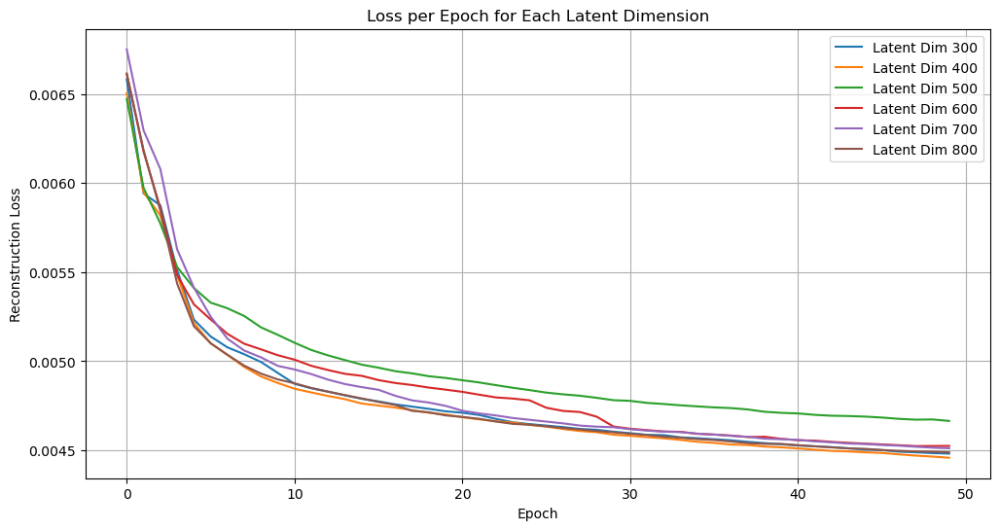

Latent Dimensions: [300, 400, 500, 600, 700, 800]
Best Losses: [0.0044809791207727455, 0.004457663447182212, 0.004664665566653841, 0.00452327415243619, 0.0045109867868531085, 0.004488293482508097]


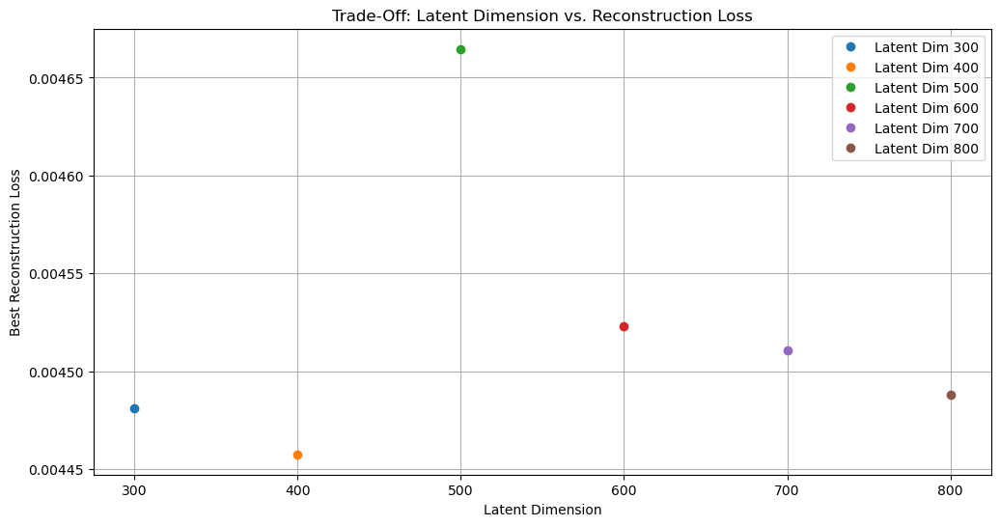

In [323]:
results, saved_models, best_model = evaluate_model(latent_dims=latent_dims, num_epochs=50, learning_rate=learning_rate, patience=patience)

In [324]:
best_model

Autoencoder(
  (encoder): Sequential(
    (0): Linear(in_features=11534, out_features=512, bias=True)
    (1): ReLU()
    (2): Linear(in_features=512, out_features=256, bias=True)
    (3): ReLU()
    (4): Linear(in_features=256, out_features=400, bias=True)
    (5): ReLU()
  )
  (decoder): Sequential(
    (0): Linear(in_features=400, out_features=256, bias=True)
    (1): ReLU()
    (2): Linear(in_features=256, out_features=512, bias=True)
    (3): ReLU()
    (4): Linear(in_features=512, out_features=11534, bias=True)
    (5): ReLU()
  )
)

In [325]:
model = best_model

with torch.no_grad():
    embeddings = []
    for batch in dataloader:
        inputs = batch.cuda()
        latent = model.encoder(inputs)
        embeddings.append(latent.cpu().numpy())
    final_embeddings = np.vstack(embeddings)  # [n_items, latent_dim]

print(f"Shape of final embeddings: {final_embeddings.shape}")
print(final_embeddings)

Shape of final embeddings: (4540, 400)
[[0.28657973 0.         0.8804388  ... 0.15226376 0.         0.77649117]
 [0.38337126 0.         0.7668563  ... 0.         0.         0.07654399]
 [0.89765435 0.         1.0193151  ... 0.         0.         0.5358989 ]
 ...
 [0.9151133  0.         0.4519688  ... 0.         0.         0.60242057]
 [0.30129918 0.08203777 1.0334971  ... 0.57749087 0.         0.76288265]
 [0.24956779 0.23499596 1.154196   ... 0.690882   0.         0.7571823 ]]


# Perform KMeans Clustering

In [326]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=50, random_state=0).fit(final_embeddings)

for cluster in range(kmeans.n_clusters):
    print("Cluster #{}".format(cluster+1))
    prods = []
    
    for idx in np.where(kmeans.labels_ == cluster)[0]:
        prod_id = grouped_final_df.new_name.iloc[idx]
        prod_type = grouped_final_df.product_type.iloc[idx]
        prods.append(f"{prod_id} - {prod_type}")
    
    for prod in prods:
        print("\t", prod)

Cluster #1
	 14k Gold-Filled Oval Saint Christopher Pendant Necklace with Black Lettering and Gold Plated Stainless Steel Chain, 20" - ['FINENECKLACEBRACELETANKLET']
	 206 Collective Men's Bower Collapsible Back Shearling Moccasin Slipper, D US - ['SHOES']
	 2L Lifestyle Hyder Wood Shelf Bookcase Tall, Brown - ['SHELF']
	 365 EVERYDAY VALUE Organic Lemonade, 64 FZ - ['GROCERY']
	 365 EVERYDAY VALUE Organic Wheat - ['GROCERY']
	 365 Everyday Value, Billion CFU, ct - ['GROCERY', 'NUTRITIONAL_SUPPLEMENT']
	 365 Everyday Value, Organic Dark Chocolate Ounce - ['CANDY']
	 365 Everyday Value, Sandalwood Foaming Hand Soap, 12 fl oz - ['SKIN_CLEANING_AGENT']
	 365 Everyday Value, Trail Mix, Backcountry Bundle, 16 oz - ['SNACK_MIX']
	 365 Everyday Value, Two-bite Chocolate Brownies Snack Pack, 2.5 oz - ['COOKIE']
	 365 Everyday Value, ct - ['GROCERY', 'MINERAL_SUPPLEMENT', 'HEALTH_PERSONAL_CARE']
	 365 by Whole Foods Market, Limited Edition Refrigerated Whipped Topping, 7 Ounce - ['GROCERY']
	 A

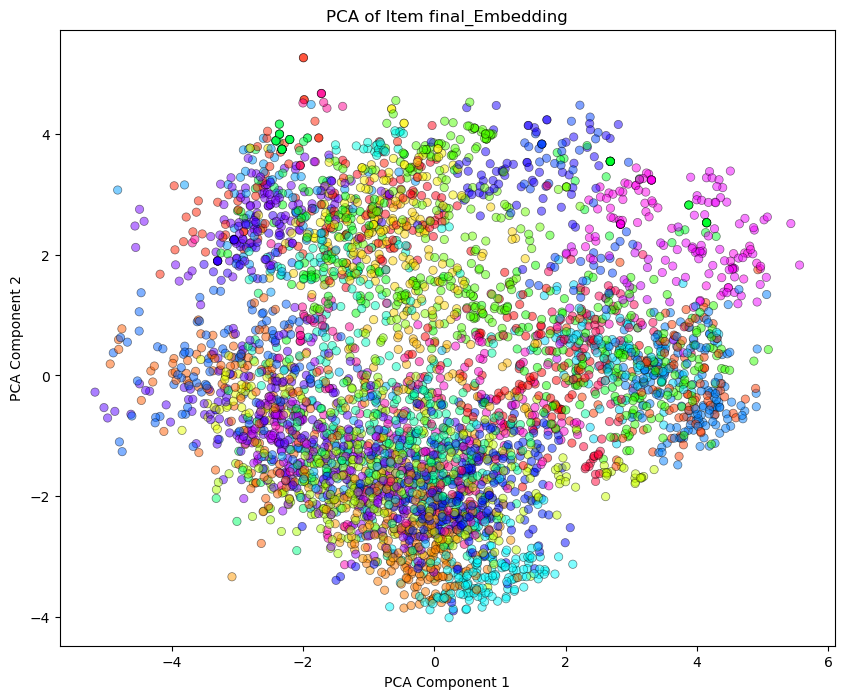

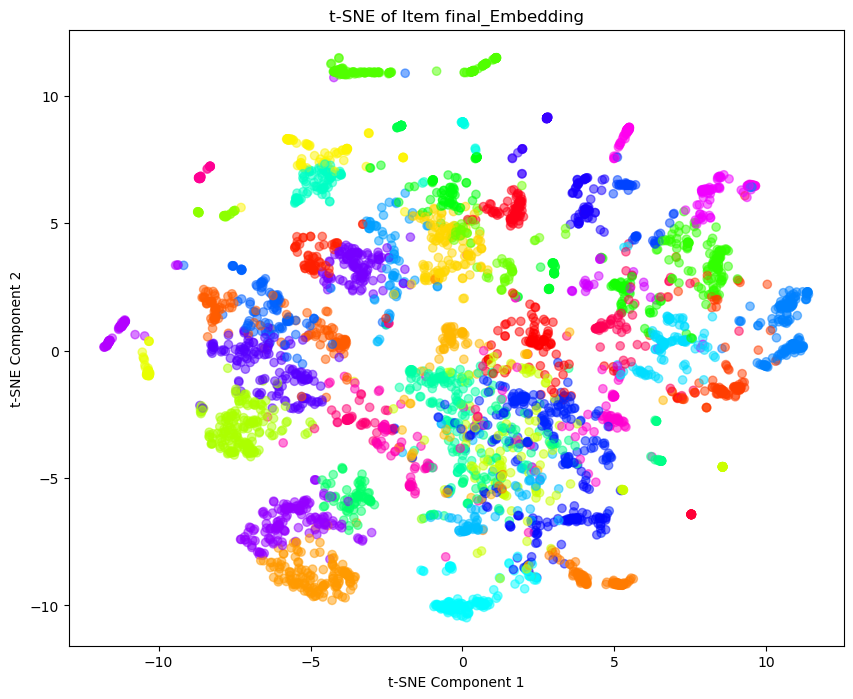

In [327]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from matplotlib.colors import ListedColormap
from matplotlib import cm

unique_labels = np.unique(kmeans.labels_)
n_labels = len(unique_labels)
cmap = ListedColormap(cm.get_cmap('hsv', n_labels)(range(n_labels)))

pca = PCA(n_components=2)
pca_result = pca.fit_transform(final_embeddings)

# Alternatively, using t-SNE for non-linear relationships
tsne = TSNE(n_components=2, perplexity=30, n_iter=300)
tsne_result = tsne.fit_transform(final_embeddings)

# Plotting PCA Result
plt.figure(figsize=(10, 8))
plt.scatter(pca_result[:, 0], pca_result[:, 1], alpha=0.5, c=kmeans.labels_, cmap = cmap,linewidth=0.5, edgecolor='k',)
plt.title('PCA of Item final_Embedding')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()

# Plotting t-SNE Result
plt.figure(figsize=(10, 8))
plt.scatter(tsne_result[:, 0], tsne_result[:, 1], alpha=0.5, c=kmeans.labels_, cmap=cmap)
plt.title('t-SNE of Item final_Embedding')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()


In [328]:
import plotly.express as px
import pandas as pd

tsne = TSNE(n_components=3, perplexity=30, n_iter=300)
tsne_result = tsne.fit_transform(final_embeddings)

df_tsne = pd.DataFrame({
    'tSNE1': tsne_result[:, 0],
    'tSNE2': tsne_result[:, 1],
    'tSNE3': tsne_result[:, 2],
    'Cluster': kmeans.labels_.astype(str)
})

fig = px.scatter_3d(
    df_tsne,
    x='tSNE1',
    y='tSNE2',
    z='tSNE3',
    color='Cluster',
    title='Interactive 3D t-SNE of Item Final Embedding',
    opacity=0.5,
    size_max=2
)
fig.show()

# Cosine Similarity Ranking

In [329]:
#import cosine similarity
from sklearn.metrics.pairwise import cosine_similarity

def pre_compute_consine_similarity(final_embeddings):
    cosine_similarities = cosine_similarity(final_embeddings)
    return cosine_similarities

def rank_items(item_name, cosine_similarities, top_n=10):
    if item_name not in grouped_final_df["new_name"].values:
        raise ValueError(f"Item '{item_name}' not found in the dataset.")
    item_idx = grouped_final_df[grouped_final_df["new_name"] == item_name].index[0]
    scores = list(enumerate(cosine_similarities[item_idx]))
    sorted_scores = sorted(scores, key=lambda x: x[1], reverse=True)
    sorted_scores = sorted_scores[1:top_n+1]
    item_indices = [i[0] for i in sorted_scores]
    similar_item_names = [grouped_final_df.new_name.iloc[i] for i in item_indices]
    similar_item_cate = [grouped_final_df.product_type.iloc[i] for i in item_indices]
    ranked_items = pd.DataFrame({
        "Similar Items": similar_item_names,
        "Similar Items Type": similar_item_cate,
        "Similarity Score": [round(i[1],3) for i in sorted_scores]
    })
    return ranked_items

In [330]:
rank_items("Amazon Brand - Solimo Basketball", pre_compute_consine_similarity(final_embeddings), top_n=10)

,Similar Items,Similar Items Type,Similarity Score
0,Amazon Brand: Amazon Brand: Find Women's Chels...,[SHOES],0.961
1,AmazonBasics Laptop Backpack (AB,[BACKPACK],0.953
2,"AmazonBasics Purple Washable School Glue, Drie...",[OFFICE_PRODUCTS],0.950
3,[Find] Amazon Collection Sterling,"[FINERING, NECKLACE, RING, EARRING]",0.950
4,"Wickedly Prime Roasted Almonds, 12 Ounce",[GROCERY],0.949
5,steeltime men's stainless steel our father pra...,[FINERING],0.949
6,"Wickedly Prime Organic Herbal Tea, Delicious H...",[TEA],0.949
7,"AmazonBasics 8"" x 10"" Photo Picture Frame or 5...",[CELLULAR_PHONE_CASE],0.945
8,206 Collective Ankle,"[BOOT, SHOES]",0.943
9,"365 Everyday Value, Key West Pink Shrimp 60-70...",[SHELLFISH],0.940


In [337]:
grouped_final_df[grouped_final_df["new_name"].apply(lambda x: bool(re.search("Amazon Brand - Solimo Basketball|AmazonBasics Laptop Backpack", x)))]

,new_name,color,marketplace,country,bullet_point,item_keywords,material,brand,product_type
773,Amazon Brand - Solimo Basketball,"[Red, Orange]",[Amazon],[IN],Basketball size: 7 Rubber bladder to prevent l...,basketball basketball size 7 basketball for ki...,Rubber,[Amazon Brand - Solimo],[RECREATION_BALL]
774,"Amazon Brand - Solimo Basketball, Size 7",[Unknown],[Amazon],[IN],Made from high-quality materials Easy to maint...,Basketball Basketballs sol_fotbl_17,Unknown,[Amazon Brand - Solimo],[SPORTING_GOODS]
1975,AmazonBasics Laptop Backpack (AB,"[Black, Unknown]",[Amazon],[US],Good quality of Twill and Grid material Fit fo...,laptop tablet handled handles case sleeve ipad...,Unknown,"[Amazon Gear, AmazonBasics]",[BACKPACK]
